In [1]:
# General
import xarray as xr    # handles netcdf data
import numpy as np     # numerical functions etc
import pandas as pd    # dataframes
import matplotlib      # plotting functions
import matplotlib.pyplot as plt    # specific plotting function I use a lot   
from matplotlib.patches import Rectangle     # specific plotting function with an annoyingly long name
import matplotlib.gridspec as gridspec #to define the sizes of plots specifically
import geopandas as gpd    # shapefiles
import cartopy     # plotting geographical features
from shapely.geometry import MultiPolygon, Polygon #to deal with 3D polygons
import regionmask    # convert shapefile to binary 0,1 mask
import re     # regular expressions (replace substrings etc)
from geopy.geocoders import Nominatim    # get lat & lon coordinates from a place name

#for climate indices
import xclim.indices as xc_i
import xclim as xc

#For plotting
import matplotlib.ticker as plticker
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import nc_time_axis #to plot cf.time axis
import cftime #to plot cf.time axis

#For Statistics
import scipy.stats as stats
from scipy import optimize
from xclim.indices.stats import fit
from scipy.stats import norm, gamma
import lmoments3.distr                     # conda activate xclim; pip install git+https://github.com/OpenHydrology/lmoments3.git
glo = getattr(lmoments3.distr, "glo")

#For copulas
import sklarpy.univariate as sk_uni
from sklarpy.copulas import gh_copula
from sklarpy.multivariate import mvt_normal
from sklarpy.copulas import MarginalFitter
from sklarpy.univariate import UnivariateFitter
from sklarpy import print_full
from sklarpy.copulas import gumbel_copula
from sklarpy.copulas import frank_copula
from sklarpy.copulas import clayton_copula

#For handling errors
import sys
import warnings

## Necessary Functions:

In [2]:
def get_SPEI_Duration_and_Severity_RunTheory(spei,threshold_drought=-0.8,threshold_minor=-1.5,threshold_combining=1):
    '''
    Summary:
    -----------
    Function which calculates the Severity-Duration pairs for a given SPEI timeseries. 
    
    Parameters:
    -----------
    spei: xarray DataArray oject
            - Timeseries containing the spei values
            
    threshold_drought: float 
            - Threshold representing the onset of a drought event
         
    threshold_minor: float 
            - Threshold representing the minium spei value for a 1-month event to be considered a drought
    
    threshold_combining: float 
            - Threshold representing the minium spei value which needs to be exceeded that two drought events which
            are separated by only one month to be considered individual events
         
    Returns:
    ----------
    Duration: Array
            - Values representing the Duration of the Drought events      
        
    Severity: Array
            - Values representing the Severity of the Drought events   
    '''
    
    #Set-up Array
    duration=[]
    severity=[]
    
    D=0
    S=0
    for t in np.arange(0,len(spei),1):
        #Drought Condition
        if spei[t]<threshold_drought:
            D=D+1
            S=S+spei[t]
            
        #To take the case into account if last value is just one month -> ongoing heatwave, 
        #only when last severity is lower than threshold_combining and severity of event larger than threshold_minor!
        elif spei[t-1]<threshold_drought and t==len(spei)-1 and spei[t]<threshold_combining and spei[t] < threshold_minor:
            D=D+1
            S=S
            
        #The condition before corrected for the last loop
        elif t!=len(spei)-1 and spei[t-1]<threshold_drought and spei[t+1]<threshold_drought and spei[t]<threshold_combining:
            D=D+1
            S=S
        
        #If the spei value is above the threshold and none of the conditions above apply that drought event is over
        else:
            duration.append(D )
            D=0
            severity.append(S)
            S=0

    #to get values if the drought ends in the loop
    duration.append(D)
    severity.append(S)
    
    #remove all durations of 1 if Severity is less than threshold (here set to: -1.5) 
    for i in np.arange(0,len(duration),1):
        if duration[i] == 1:
            if severity[i] > threshold_minor:
                duration[i] = 0
                severity[i] = 0
                
    #Remove all 0 and define severity positive
    duration = np.array(duration)
    duration = duration[duration>0]
    
    severity = np.array(severity)
    severity = -severity
    severity = severity[severity>0]      
    
    return duration, severity

# Effective Precipitation check

In [3]:
#Link to the directory of the evaluation data
dir_data = '/rds/general/user/nmerz/home/MSc_Diss/data/AR6_regions/'

### Load in data

#### Obsv

In [4]:
#era5
fn_eval_ef_pr_m_era5 = dir_data + 'obs/era5/eff_precip/eval_eff_precip_land_m.nc'
eval_ef_pr_m_era5 = xr.open_dataset(fn_eval_ef_pr_m_era5)
eval_ef_pr_m_era5 = eval_ef_pr_m_era5.__xarray_dataarray_variable__

fn_eval_ef_pr_arr_era5 = dir_data + 'obs/era5/eff_precip/eval_eff_precip_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_era5 = np.loadtxt(fn_eval_ef_pr_arr_era5,delimiter=";")

#mswep
fn_eval_ef_pr_m_mswep = dir_data + 'obs/mswep_mswx/eff_precip/eval_eff_precip_land_m.nc'
eval_ef_pr_m_mswep = xr.open_dataset(fn_eval_ef_pr_m_mswep)
eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.__xarray_dataarray_variable__

fn_eval_ef_pr_arr_mswep = dir_data + 'obs/mswep_mswx/eff_precip/eval_eff_precip_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_mswep = np.loadtxt(fn_eval_ef_pr_arr_mswep,delimiter=";")

#### Model

In [5]:
#ACCESS-CM2 #AccessCm2
fn_eval_ef_pr_m_AccessCm2 = dir_data + 'CMIP6/ACCESS-CM2/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_AccessCm2 = xr.open_dataset(fn_eval_ef_pr_m_AccessCm2)
eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_AccessCm2 = dir_data + 'CMIP6/ACCESS-CM2/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_AccessCm2 = np.loadtxt(fn_eval_ef_pr_arr_AccessCm2,delimiter=";")

#ACCESS-ESM1-5
fn_eval_ef_pr_m_AccessEsm15 = dir_data + 'CMIP6/ACCESS-ESM1-5/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_AccessEsm15 = xr.open_dataset(fn_eval_ef_pr_m_AccessEsm15)
eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_AccessEsm15 = dir_data + 'CMIP6/ACCESS-ESM1-5/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_AccessEsm15 = np.loadtxt(fn_eval_ef_pr_arr_AccessEsm15,delimiter=";")

#CanESM5
fn_eval_ef_pr_m_CanEsm5 = dir_data + 'CMIP6/CanESM5/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_CanEsm5 = xr.open_dataset(fn_eval_ef_pr_m_CanEsm5)
eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_CanEsm5 = dir_data + 'CMIP6/CanESM5/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_CanEsm5 = np.loadtxt(fn_eval_ef_pr_arr_CanEsm5,delimiter=";")

#FGOALS-g3
fn_eval_ef_pr_m_FgoalsG3= dir_data + 'CMIP6/FGOALS-g3/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_FgoalsG3 = xr.open_dataset(fn_eval_ef_pr_m_FgoalsG3)
eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_FgoalsG3 = dir_data + 'CMIP6/FGOALS-g3/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_FgoalsG3 = np.loadtxt(fn_eval_ef_pr_arr_FgoalsG3,delimiter=";")

#IPSL-CM6A-LR
fn_eval_ef_pr_m_IpslCm6aLr = dir_data + 'CMIP6/IPSL-CM6A-LR/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_IpslCm6aLr = xr.open_dataset(fn_eval_ef_pr_m_IpslCm6aLr)
eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_IpslCm6aLr = dir_data + 'CMIP6/IPSL-CM6A-LR/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_IpslCm6aLr = np.loadtxt(fn_eval_ef_pr_arr_IpslCm6aLr,delimiter=";")

#MIROC6
fn_eval_ef_pr_m_Miroc6 = dir_data + 'CMIP6/MIROC6/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_Miroc6 = xr.open_dataset(fn_eval_ef_pr_m_Miroc6)
eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_Miroc6 = dir_data + 'CMIP6/MIROC6/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_Miroc6 = np.loadtxt(fn_eval_ef_pr_arr_Miroc6,delimiter=";")

#MRI-ESM2-0
fn_eval_ef_pr_m_MriEsm20 = dir_data + 'CMIP6/MRI-ESM2-0/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_MriEsm20 = xr.open_dataset(fn_eval_ef_pr_m_MriEsm20)
eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_MriEsm20 = dir_data + 'CMIP6/MRI-ESM2-0/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_MriEsm20 = np.loadtxt(fn_eval_ef_pr_arr_MriEsm20,delimiter=";")

#NorESM2-LM
fn_eval_ef_pr_m_NorEsm2Lm = dir_data + 'CMIP6/NorESM2-LM/eff_precip/eval_eff_precip_land_historic_m.nc'
eval_ef_pr_m_NorEsm2Lm = xr.open_dataset(fn_eval_ef_pr_m_NorEsm2Lm)
eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.__xarray_dataarray_variable__
fn_eval_ef_pr_arr_NorEsm2Lm = dir_data + 'CMIP6/NorESM2-LM/eff_precip/eval_eff_precip_historic_land_mdoy_CUT_wmLL_arr.csv'
eval_ef_pr_arr_NorEsm2Lm = np.loadtxt(fn_eval_ef_pr_arr_NorEsm2Lm,delimiter=";")

### Load Shapefiles

In [6]:
sf_all = gpd.read_file("/rds/general/user/nmerz/home/MSc_Diss/data/AR6_regions/shapefile").to_crs(cartopy.crs.PlateCarree())
sf_SA = sf_all[sf_all['Acronym'].str.contains("NWS|NSA|NES|SAM|SWS|SES|SSA")]
rm_SA = regionmask.mask_3D_geopandas(sf_SA, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_9 = sf_all[sf_all['Acronym'].str.contains("NWS")]
rm_9 = regionmask.mask_3D_geopandas(sf_9, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_10 = sf_all[sf_all['Acronym'].str.contains("NSA")]
rm_10 = regionmask.mask_3D_geopandas(sf_10, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_11 = sf_all[sf_all['Acronym'].str.contains("NES")]
rm_11 = regionmask.mask_3D_geopandas(sf_11, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_12 = sf_all[sf_all['Acronym'].str.contains("SAM")]
rm_12 = regionmask.mask_3D_geopandas(sf_12, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_13 = sf_all[sf_all['Acronym'].str.contains("SWS")]
rm_13 = regionmask.mask_3D_geopandas(sf_13, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_14 = sf_all[sf_all['Acronym'].str.contains("SES")]
rm_14 = regionmask.mask_3D_geopandas(sf_14, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
sf_15 = sf_all[sf_all['Acronym'].str.contains("SSA")]
rm_15 = regionmask.mask_3D_geopandas(sf_15, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)

In [7]:
names = np.array(["","ERA5","MSWEP/MSWX","","Access-CM2","Access-ESM5","Can-ESM5","FGOALS-g3","IPSL-CM6A-LR","MIROC6","MRI-ESM2-0","NorESM2-LM"])

## Spatial Evaluation

### Region 9

In [8]:
sf = sf_9

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

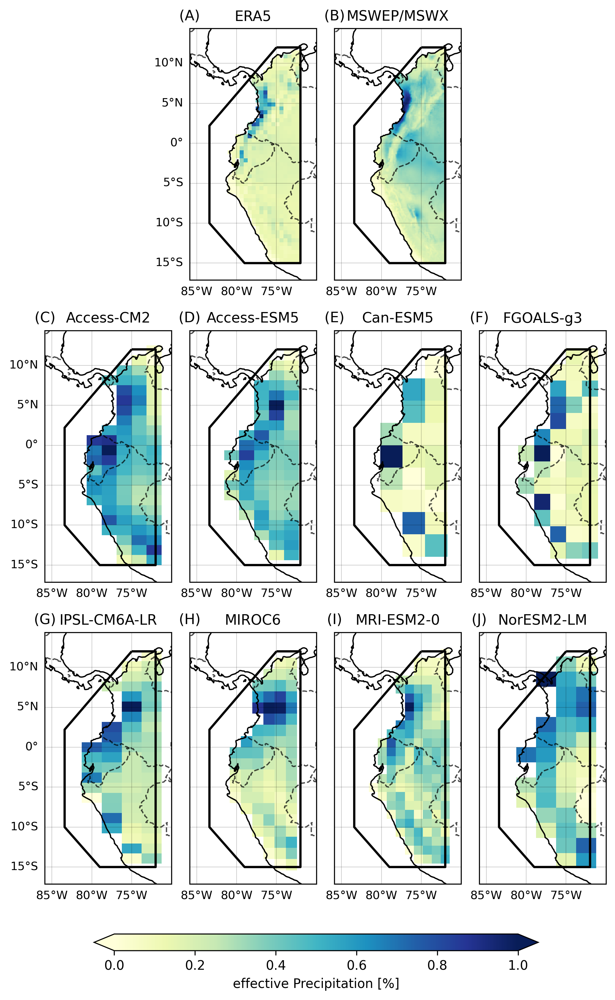

In [9]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,12), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.2)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-70.01])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.015])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        #print(i)
        axes.annotate(labels[i], xy=(0.0, 1.049), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

plt.savefig('images/eval_spatial_09.png', bbox_inches='tight', pad_inches=0)

### Region 10

In [10]:
sf = sf_10

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

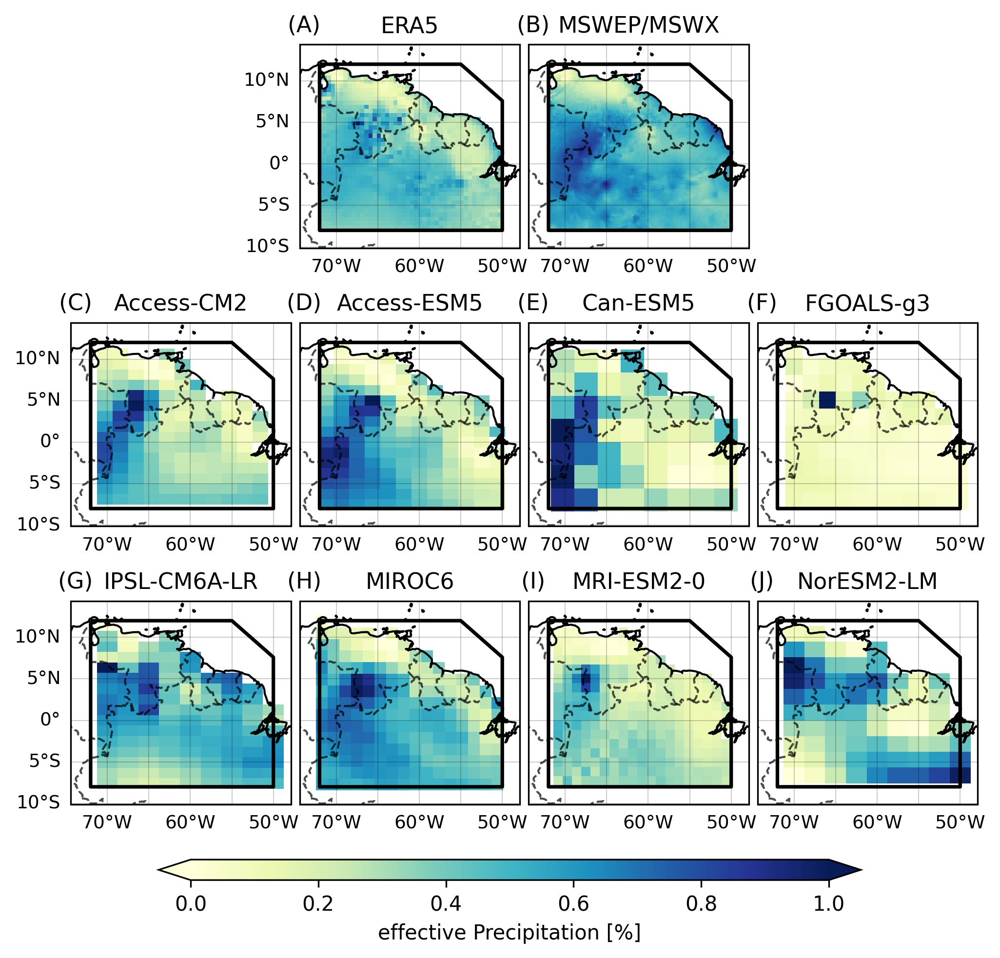

In [11]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,7), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.2)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        #print(i)
        axes.annotate(labels[i], xy=(0.02, 1.095), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

plt.savefig('images/eval_spatial_10.png', bbox_inches='tight', pad_inches=0)

### Region 11

In [12]:
sf = sf_11

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

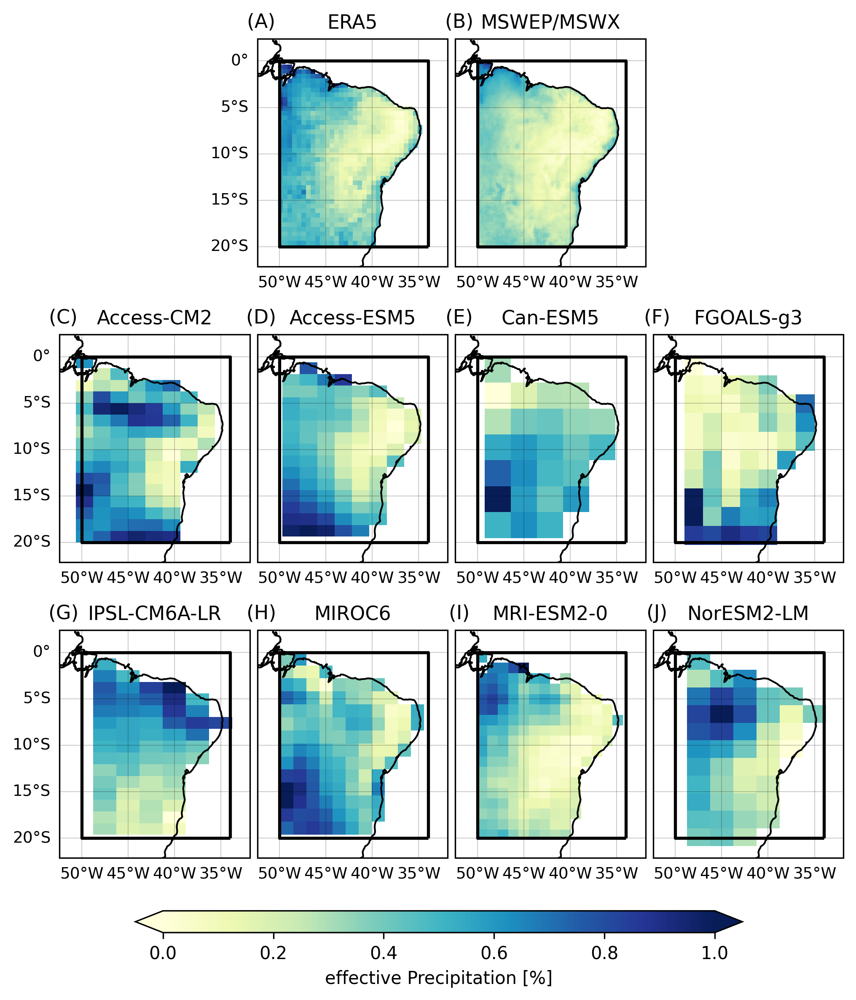

In [17]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,8.6), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.20)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.xlocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        axes.annotate(labels[i], xy=(0.02, 1.075), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

### Region 12

In [18]:
sf = sf_12

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

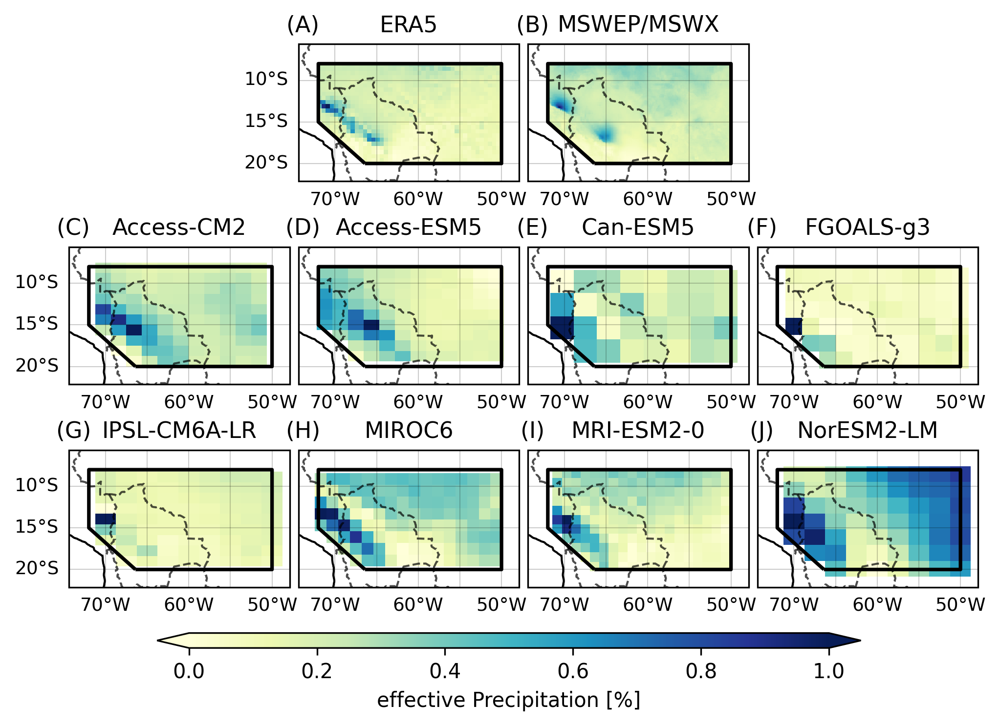

In [22]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,5.1), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.20)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        axes.annotate(labels[i], xy=(0.02, 1.135), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

### Region 13

In [23]:
sf = sf_13

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

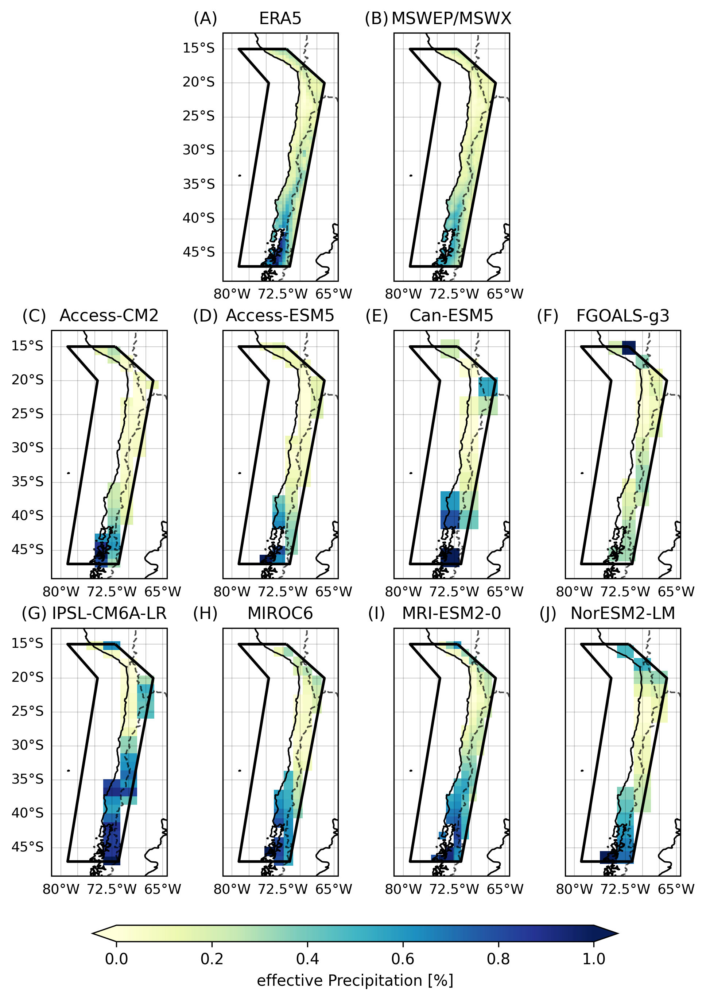

In [33]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,10), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.20)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.015])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        axes.annotate(labels[i], xy=(-0.15, 1.056), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

### Region 14

In [34]:
sf = sf_14

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

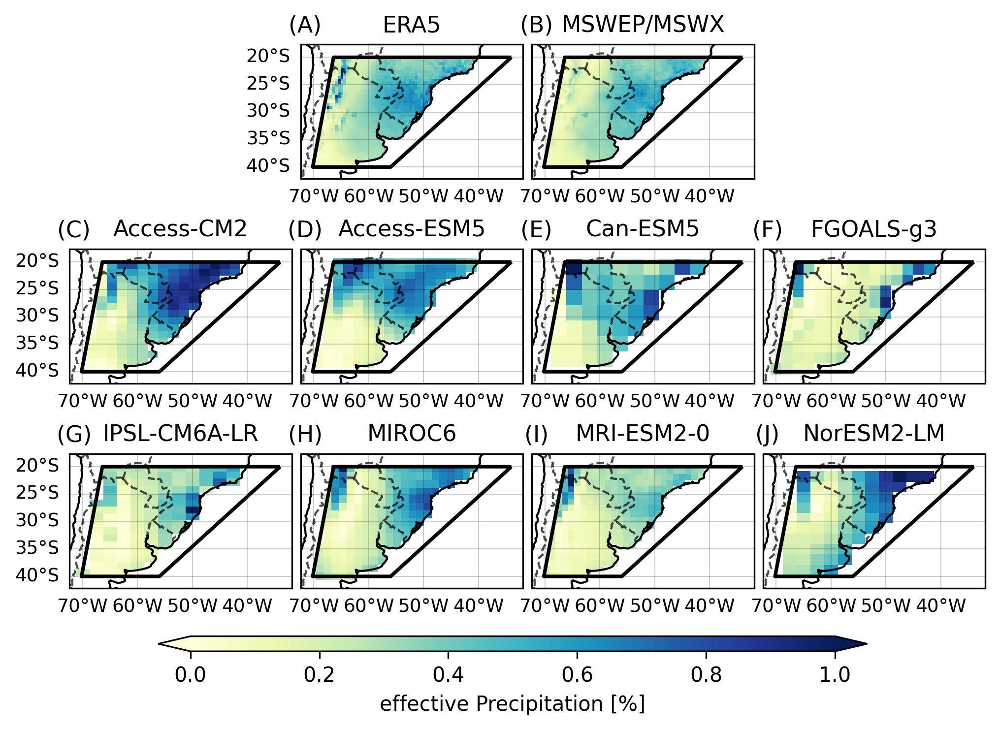

In [39]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,5.1), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.20)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        axes.annotate(labels[i], xy=(0.02, 1.135), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

### Region 15

In [40]:
sf = sf_15

#obs
rm_era5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_era5.lon, eval_ef_pr_m_era5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_era5 = eval_ef_pr_m_era5.where(rm_era5).mean(dim="time")
stand_eval_ef_pr_m_era5 = (tmp_eval_ef_pr_m_era5 - tmp_eval_ef_pr_m_era5.min())/(tmp_eval_ef_pr_m_era5.max()-tmp_eval_ef_pr_m_era5.min())
rm_mswep = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_mswep.lon, eval_ef_pr_m_mswep.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_mswep = eval_ef_pr_m_mswep.where(rm_mswep).mean(dim="time")
stand_eval_ef_pr_m_mswep = (tmp_eval_ef_pr_m_mswep - tmp_eval_ef_pr_m_mswep.min())/(tmp_eval_ef_pr_m_mswep.max()-tmp_eval_ef_pr_m_mswep.min())
#model
rm_AccessCm2 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessCm2.lon, eval_ef_pr_m_AccessCm2.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessCm2 = eval_ef_pr_m_AccessCm2.where(rm_AccessCm2).mean(dim="time")
stand_eval_ef_pr_m_AccessCm2 = (tmp_eval_ef_pr_m_AccessCm2 - tmp_eval_ef_pr_m_AccessCm2.min())/(tmp_eval_ef_pr_m_AccessCm2.max()-tmp_eval_ef_pr_m_AccessCm2.min())
rm_AccessEsm15 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_AccessEsm15.lon, eval_ef_pr_m_AccessEsm15.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_AccessEsm15 = eval_ef_pr_m_AccessEsm15.where(rm_AccessEsm15).mean(dim="time")
stand_eval_ef_pr_m_AccessEsm15 = (tmp_eval_ef_pr_m_AccessEsm15 - tmp_eval_ef_pr_m_AccessEsm15.min())/(tmp_eval_ef_pr_m_AccessEsm15.max()-tmp_eval_ef_pr_m_AccessEsm15.min())
rm_CanEsm5 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_CanEsm5.lon, eval_ef_pr_m_CanEsm5.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_CanEsm5 = eval_ef_pr_m_CanEsm5.where(rm_CanEsm5).mean(dim="time")
stand_eval_ef_pr_m_CanEsm5 = (tmp_eval_ef_pr_m_CanEsm5 - tmp_eval_ef_pr_m_CanEsm5.min())/(tmp_eval_ef_pr_m_CanEsm5.max()-tmp_eval_ef_pr_m_CanEsm5.min())
rm_FgoalsG3 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_FgoalsG3.lon, eval_ef_pr_m_FgoalsG3.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_FgoalsG3 = eval_ef_pr_m_FgoalsG3.where(rm_FgoalsG3).mean(dim="time")
stand_eval_ef_pr_m_FgoalsG3 = (tmp_eval_ef_pr_m_FgoalsG3 - tmp_eval_ef_pr_m_FgoalsG3.min())/(tmp_eval_ef_pr_m_FgoalsG3.max()-tmp_eval_ef_pr_m_FgoalsG3.min())
rm_IpslCm6aLr = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_IpslCm6aLr.lon, eval_ef_pr_m_IpslCm6aLr.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_IpslCm6aLr = eval_ef_pr_m_IpslCm6aLr.where(rm_IpslCm6aLr).mean(dim="time")
stand_eval_ef_pr_m_IpslCm6aLr = (tmp_eval_ef_pr_m_IpslCm6aLr - tmp_eval_ef_pr_m_IpslCm6aLr.min())/(tmp_eval_ef_pr_m_IpslCm6aLr.max()-tmp_eval_ef_pr_m_IpslCm6aLr.min())
rm_Miroc6 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_Miroc6.lon, eval_ef_pr_m_Miroc6.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_Miroc6 = eval_ef_pr_m_Miroc6.where(rm_Miroc6).mean(dim="time")
stand_eval_ef_pr_m_Miroc6 = (tmp_eval_ef_pr_m_Miroc6 - tmp_eval_ef_pr_m_Miroc6.min())/(tmp_eval_ef_pr_m_Miroc6.max()-tmp_eval_ef_pr_m_Miroc6.min())
rm_MriEsm20 = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_MriEsm20.lon, eval_ef_pr_m_MriEsm20.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_MriEsm20 = eval_ef_pr_m_MriEsm20.where(rm_MriEsm20).mean(dim="time")
stand_eval_ef_pr_m_MriEsm20 = (tmp_eval_ef_pr_m_MriEsm20 - tmp_eval_ef_pr_m_MriEsm20.min())/(tmp_eval_ef_pr_m_MriEsm20.max()-tmp_eval_ef_pr_m_MriEsm20.min())
rm_NorEsm2Lm = regionmask.mask_3D_geopandas(sf, eval_ef_pr_m_NorEsm2Lm.lon, eval_ef_pr_m_NorEsm2Lm.lat).squeeze(drop = True)
tmp_eval_ef_pr_m_NorEsm2Lm = eval_ef_pr_m_NorEsm2Lm.where(rm_NorEsm2Lm).mean(dim="time")
stand_eval_ef_pr_m_NorEsm2Lm = (tmp_eval_ef_pr_m_NorEsm2Lm - tmp_eval_ef_pr_m_NorEsm2Lm.min())/(tmp_eval_ef_pr_m_NorEsm2Lm.max()-tmp_eval_ef_pr_m_NorEsm2Lm.min())

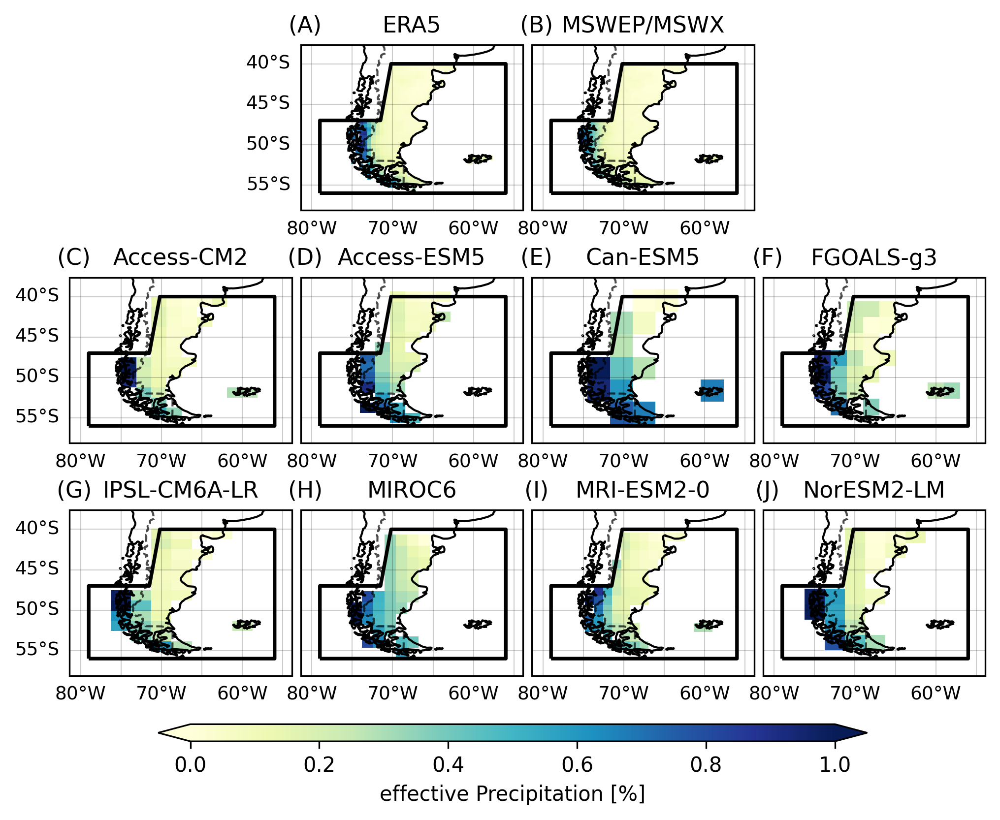

In [45]:
fig, ax = plt.subplots(ncols = 4, nrows = 3, figsize = (8,5.8), dpi = 300, subplot_kw = {"projection" : cartopy.crs.PlateCarree()})
fig.subplots_adjust(wspace=0.04)
fig.subplots_adjust(hspace=0.20)
elev_kwargs = {"cmap" : "YlGnBu",
               "vmin" : 0, 
               "vmax" : 1}
fig.delaxes(ax[0][0])
fig.delaxes(ax[0][3])
#obs
cbar=stand_eval_ef_pr_m_era5.plot(ax = ax[0][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_mswep.plot(ax = ax[0][2], **elev_kwargs, add_colorbar=False)
#model
stand_eval_ef_pr_m_AccessCm2.plot(ax = ax[1][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_AccessEsm15.plot(ax = ax[1][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_CanEsm5.plot(ax = ax[1][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_FgoalsG3.plot(ax = ax[1][3], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_IpslCm6aLr.plot(ax = ax[2][0], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_Miroc6.plot(ax = ax[2][1], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_MriEsm20.plot(ax = ax[2][2], **elev_kwargs, add_colorbar=False)
stand_eval_ef_pr_m_NorEsm2Lm.plot(ax = ax[2][3], **elev_kwargs, add_colorbar=False)

ticker=0
for j in np.arange(0,3):
    for i in np.arange(0,4):
        #glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
        ax[j][i].coastlines()
        ax[j][i].add_feature(cartopy.feature.BORDERS, lw = 1, alpha = 0.7, ls = "--", zorder = 99)
        ax[j][i].set_title(names[ticker], loc = "center",fontsize=11)
        ax[j][i].set_xlim([-362.5+eval_ef_pr_m_era5.lon.where(rm_era5).min().to_numpy(),-357.5+eval_ef_pr_m_era5.lon.where(rm_era5).max().to_numpy()])
        ax[j][i].set_ylim([eval_ef_pr_m_era5.lat.where(rm_era5).min().to_numpy()-2.5,eval_ef_pr_m_era5.lat.where(rm_era5).max().to_numpy()+2.5])
        #glt.top_labels = False
        #glt.right_labels = False
        sf.boundary.plot(ax = ax[j][i], lw = 1.75, color = "black")
        ticker+=1
    
glt_0 = ax[0][1].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_0.top_labels = False
glt_0.right_labels = False
glt_0.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_0.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_0.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

glt_1 = ax[0][2].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
glt_1.top_labels = False
glt_1.left_labels = False
glt_1.right_labels = False
glt_1.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
glt_1.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
glt_1.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels

for j in np.arange(1,3):
    for i in np.arange(0,4):
        if i == 0:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        else:
            glt = ax[j][i].gridlines(crs=cartopy.crs.PlateCarree(), linewidth=0.5, color='black', alpha=0.2, draw_labels=True)
            glt.top_labels = False
            glt.left_labels = False
            glt.right_labels = False
            glt.ylocator = plt.MultipleLocator(base=5.0)  # Draw gridlines at every 5th latitude
            glt.xlabel_style = {'size': 9}  # Adjust the font size of x-axis labels
            glt.ylabel_style = {'size': 9}  # Adjust the font size of y-axis labels
        
cbar_ax = fig.add_axes([0.2, 0.05, 0.6, 0.02])        
cbar = plt.colorbar(cbar, cax=cbar_ax, location = "bottom", fraction = 0.03, pad = 0.09, extend = "both")
cbar.set_label(label = "effective Precipitation [%]",fontsize=10)

# Add subplot labels
labels = ["",'(A)', '(B)',"", '(C)', '(D)','(E)', '(F)', '(G)', '(H)','(I)', '(J)']
for i, axes in enumerate(ax.flat): 
    if i != 0 or i != 3:
        axes.annotate(labels[i], xy=(0.02, 1.114), xycoords='axes fraction',
                      fontsize=11, ha='center', va='center')

## Seasonal Evaluation

### Region 9

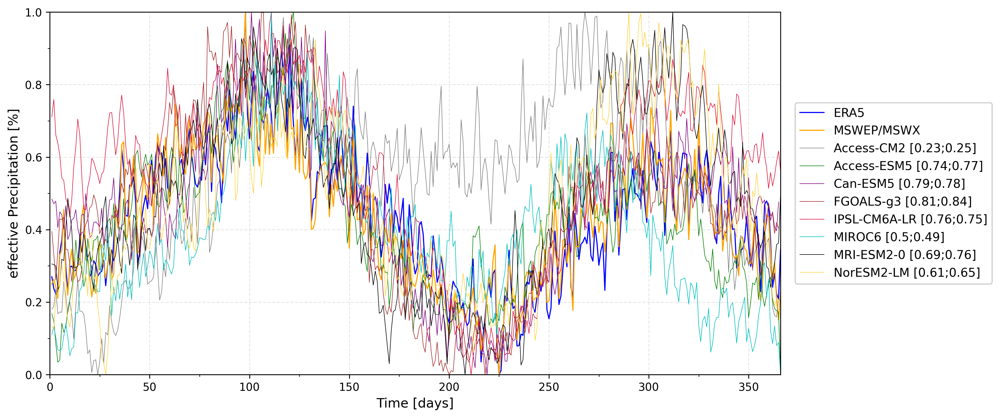

In [8]:
region = 9
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

#plt.savefig('images/eval_seasonal_09.png', bbox_inches='tight', pad_inches=0)

### Region 10

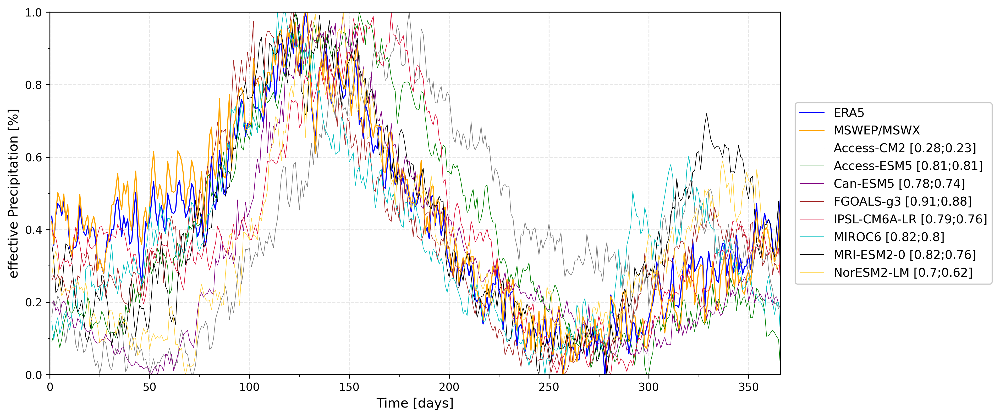

In [10]:
region = 10
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

### Region 11

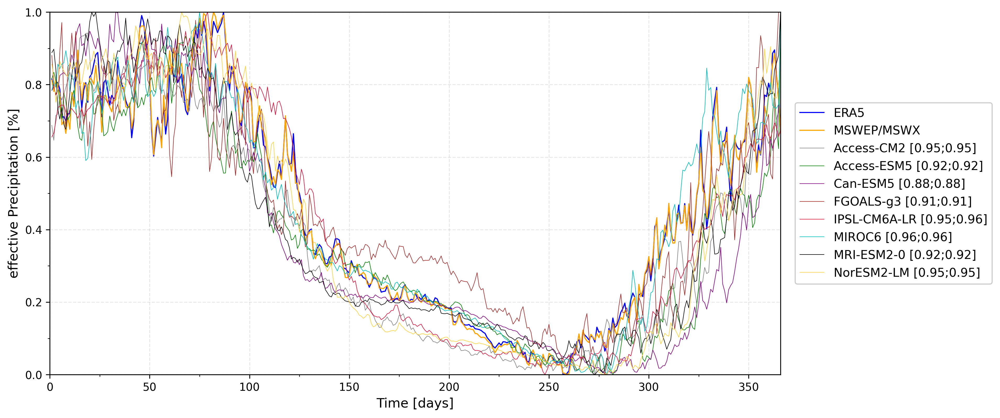

In [11]:
region = 11
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

### Region 12

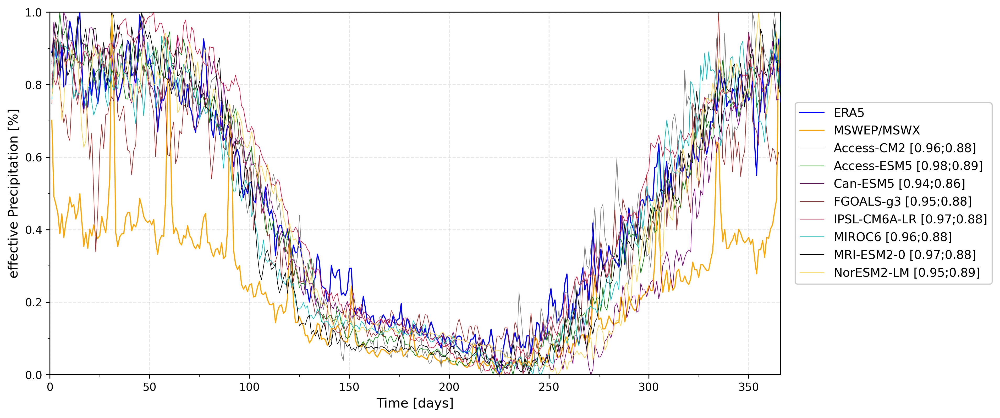

In [12]:
region = 12
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

### Region 13

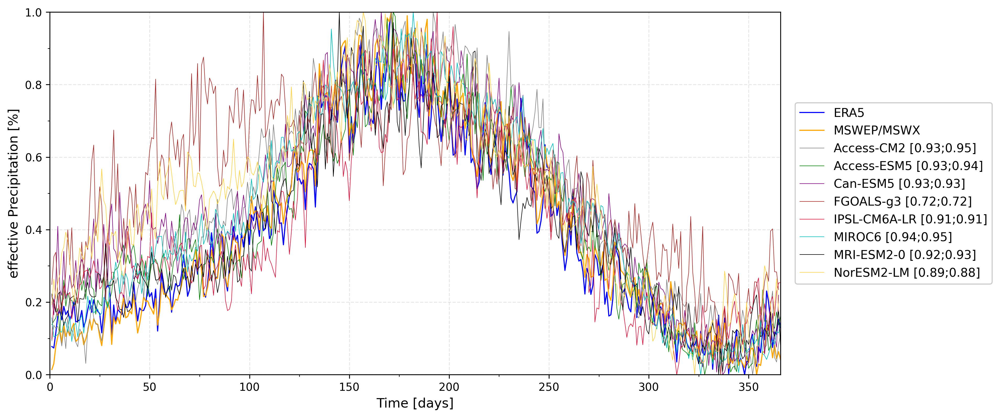

In [13]:
region = 13
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

### Region 14

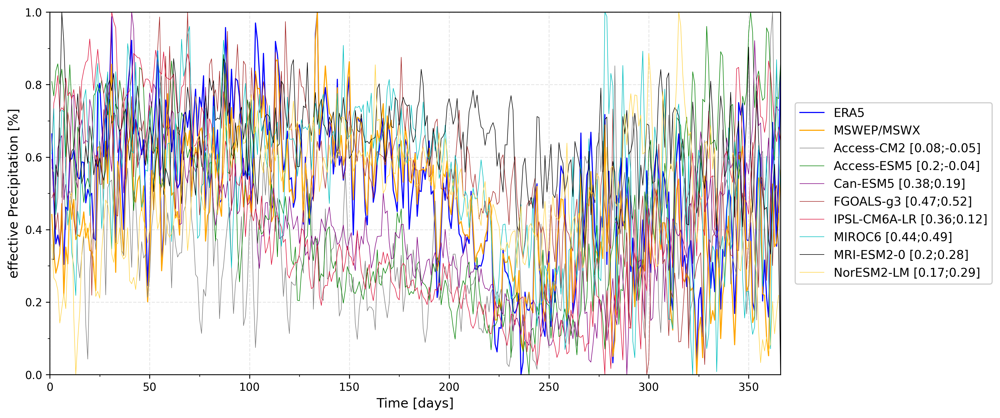

In [14]:
region = 14
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')

### Region 15

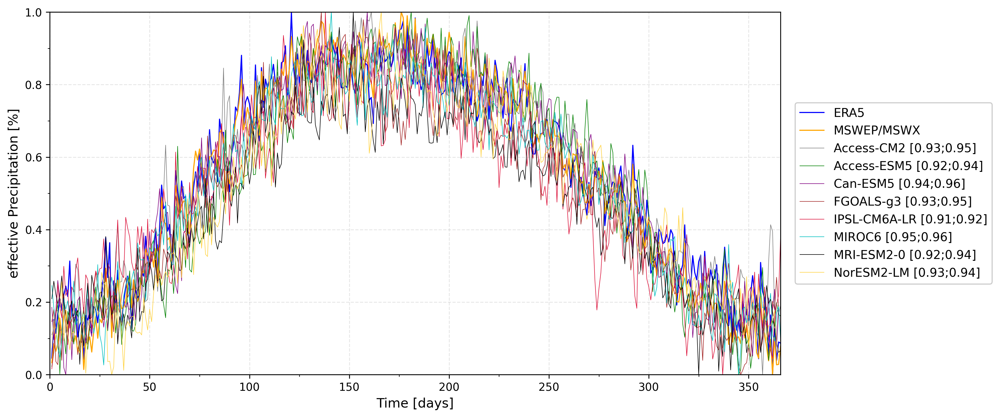

In [15]:
region = 15
index = region - 8

stand_eval_ef_pr_arr_era5 = (eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))/max(eval_ef_pr_arr_era5[index]-min(eval_ef_pr_arr_era5[index]))
stand_eval_ef_pr_arr_mswep = (eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))/max(eval_ef_pr_arr_mswep[index]-min(eval_ef_pr_arr_mswep[index]))
stand_eval_ef_pr_arr_AccessCm2 = (eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))/max(eval_ef_pr_arr_AccessCm2[index]-min(eval_ef_pr_arr_AccessCm2[index]))
stand_eval_ef_pr_arr_AccessEsm15 = (eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))/max(eval_ef_pr_arr_AccessEsm15[index]-min(eval_ef_pr_arr_AccessEsm15[index]))
stand_eval_ef_pr_arr_CanEsm5 = (eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))/max(eval_ef_pr_arr_CanEsm5[index]-min(eval_ef_pr_arr_CanEsm5[index]))
stand_eval_ef_pr_arr_FgoalsG3 = (eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))/max(eval_ef_pr_arr_FgoalsG3[index]-min(eval_ef_pr_arr_FgoalsG3[index]))
stand_eval_ef_pr_arr_IpslCm6aLr = (eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))/max(eval_ef_pr_arr_IpslCm6aLr[index]-min(eval_ef_pr_arr_IpslCm6aLr[index]))
stand_eval_ef_pr_arr_Miroc6 = (eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))/max(eval_ef_pr_arr_Miroc6[index]-min(eval_ef_pr_arr_Miroc6[index]))
stand_eval_ef_pr_arr_MriEsm20 = (eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))/max(eval_ef_pr_arr_MriEsm20[index]-min(eval_ef_pr_arr_MriEsm20[index]))
stand_eval_ef_pr_arr_NorEsm2Lm = (eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))/max(eval_ef_pr_arr_NorEsm2Lm[index]-min(eval_ef_pr_arr_NorEsm2Lm[index]))

#Calc Correlation
pearr_AccessCm2_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessCm2_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessCm2).statistic,2)
pearr_AccessEsm15_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_AccessEsm15_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_AccessEsm15).statistic,2)
pearr_CanEsm5_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_CanEsm5_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_CanEsm5).statistic,2)
pearr_FgoalsG3_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_FgoalsG3_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_FgoalsG3).statistic,2)
pearr_IpslCm6aLr_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_IpslCm6aLr_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_IpslCm6aLr).statistic,2)
pearr_Miroc6_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_Miroc6_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_Miroc6).statistic,2)
pearr_MriEsm20_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_MriEsm20_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep,stand_eval_ef_pr_arr_MriEsm20).statistic,2)
pearr_NorEsm2Lm_era5 = round(stats.pearsonr(stand_eval_ef_pr_arr_era5[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)
pearr_NorEsm2Lm_mswep = round(stats.pearsonr(stand_eval_ef_pr_arr_mswep[:-1],stand_eval_ef_pr_arr_NorEsm2Lm).statistic,2)

fig, ax = plt.subplots(figsize=(12,6),dpi = 300)
plt.plot(eval_ef_pr_arr_era5[0],stand_eval_ef_pr_arr_era5,label=names[1], color='blue',lw=1)
plt.plot(eval_ef_pr_arr_mswep[0],stand_eval_ef_pr_arr_mswep,label=names[2], color='orange',lw=1)
fn_stand_eval_ef_pr_arr_AccessCm2 = names[4] + " [{};{}]".format(pearr_AccessCm2_era5,pearr_AccessCm2_mswep)
plt.plot(eval_ef_pr_arr_AccessCm2[0],stand_eval_ef_pr_arr_AccessCm2,label=fn_stand_eval_ef_pr_arr_AccessCm2, color='gray',lw=.5)
fn_stand_eval_ef_pr_arr_AccessEsm15 = names[5] + " [{};{}]".format(pearr_AccessEsm15_era5,pearr_AccessEsm15_mswep)
plt.plot(eval_ef_pr_arr_AccessEsm15[0],stand_eval_ef_pr_arr_AccessEsm15,label=fn_stand_eval_ef_pr_arr_AccessEsm15, color='green',lw=.5)
fn_stand_eval_ef_pr_arr_CanEsm5 = names[6] + " [{};{}]".format(pearr_CanEsm5_era5,pearr_CanEsm5_mswep)
plt.plot(eval_ef_pr_arr_CanEsm5[0],stand_eval_ef_pr_arr_CanEsm5,label=fn_stand_eval_ef_pr_arr_CanEsm5, color='purple',lw=.5)
fn_stand_eval_ef_pr_arr_FgoalsG3 = names[7] + " [{};{}]".format(pearr_FgoalsG3_era5,pearr_FgoalsG3_mswep)
plt.plot(eval_ef_pr_arr_FgoalsG3[0],stand_eval_ef_pr_arr_FgoalsG3,label=fn_stand_eval_ef_pr_arr_FgoalsG3, color='brown',lw=.5)
fn_stand_eval_ef_pr_arr_IpslCm6aLr = names[8] + " [{};{}]".format(pearr_IpslCm6aLr_era5,pearr_IpslCm6aLr_mswep)
plt.plot(eval_ef_pr_arr_IpslCm6aLr[0],stand_eval_ef_pr_arr_IpslCm6aLr,label=fn_stand_eval_ef_pr_arr_IpslCm6aLr, color='crimson',lw=.5)
fn_stand_eval_ef_pr_arr_Miroc6 = names[9] + " [{};{}]".format(pearr_Miroc6_era5,pearr_Miroc6_mswep)
plt.plot(eval_ef_pr_arr_Miroc6[0],stand_eval_ef_pr_arr_Miroc6,label=fn_stand_eval_ef_pr_arr_Miroc6, color='c',lw=.5)
fn_stand_eval_ef_pr_arr_MriEsm20 = names[10] + " [{};{}]".format(pearr_MriEsm20_era5,pearr_MriEsm20_mswep)
plt.plot(eval_ef_pr_arr_MriEsm20[0],stand_eval_ef_pr_arr_MriEsm20,label=fn_stand_eval_ef_pr_arr_MriEsm20, color='black',lw=.5)
fn_stand_eval_ef_pr_arr_NorEsm2Lm = names[11] + " [{};{}]".format(pearr_NorEsm2Lm_era5,pearr_NorEsm2Lm_mswep)
plt.plot(eval_ef_pr_arr_NorEsm2Lm[0],stand_eval_ef_pr_arr_NorEsm2Lm,label=fn_stand_eval_ef_pr_arr_NorEsm2Lm, color='#ffd343',lw=.5)

ax.set_xlim(0, 366)
plt.ylim(0,1)
#plt.xlim((xmin, xmax))
#ax.set_xticks(time_precip)
#ax.set_xticklabels(display_time_precip)


legend = plt.legend(bbox_to_anchor=(1.02, 0.5), loc="center left", borderaxespad=0,fontsize='11')
legend.get_frame().set_alpha(0.5)
legend.get_frame().set_alpha(None)

ax.yaxis.set_major_locator(MultipleLocator(0.2))# defines setting of the small ticks
ax.yaxis.set_minor_locator(MultipleLocator(.1))
ax.xaxis.set_minor_locator(MultipleLocator(25))

#title_str = "Seasonal effective precipitation evaluation region = {}".format(region)
#ax.set_title(title_str,fontsize='14')
ax.set_xlabel(r'Time [days]',fontsize='12')
ax.set_ylabel(r'effective Precipitation [%]',fontsize='12')
ax.tick_params(axis='both', which='major', labelsize='10')
plt.grid(True,alpha=0.3,linestyle = 'dashed')